In [1]:
import re
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
df = pd.read_excel(r"C:\Users\User\Desktop\Chargebacks.xlsx")

In [3]:
with pd.option_context("display.max_rows", None, "display.max_columns", None):
  display(df)

,merchant_token,payer_id,payment_token,payment_date,payment_size_usd,chargeback_size_usd,chargeback_type,was_cased,business_category,square_signup_date,latitude,longitude,brand,DTFP
0,80KRACC0TR9NS,4.113711e+18,00039e4VcWoFteyKoOFgrxMF,2017-11-13 00:00:00,54.00,NaN,NaN,0,food_and_drink,2016-06-18 00:00:00,NaN,NaN,mastercard,513.0
1,871SVKV4QD8R8,1.409266e+18,0003kjGaRG2cL7UjO81AOuMF,2017-04-18 00:00:00,13.00,NaN,NaN,0,food_and_drink,2017-04-12 00:00:00,33.680353,-116.239987,visa,6.0
2,1F6MP4FDY8RT0,6.871931e+18,0004iBPL8ImAZXsEQsRCHtMF,2017-10-22 00:00:00,11.00,NaN,NaN,0,food_and_drink,2017-02-02 00:00:00,37.577944,-122.348436,visa,262.0
3,93P0E34G3N5KT,2.981399e+18,0006gFkSZwNmNfcukW8MvsMF,2017-12-11 00:00:00,4.25,NaN,NaN,0,food_and_drink,2016-10-07 00:00:00,37.764143,-122.433153,visa,430.0
4,6AKZKTCPT491V,2.124634e+18,0007La0mmD20DwXNPtXgZuMF,2017-11-14 00:00:00,11.00,NaN,NaN,0,food_and_drink,2016-11-28 00:00:00,NaN,NaN,visa,351.0
5,3E9WC26W2KTJS,1.867224e+18,000AC59vADKlXIgjKpFrBuMF,2017-04-13 00:00:00,4.00,NaN,NaN,0,food_and_drink,2016-12-06 00:00:00,45.478116,-122.672753,mastercard,128.0
6,3047Q3BS969AK,8.221004e+18,000E7w4UPZfgL34bhXYVosMF,2017-09-24 00:00:00,22.50,NaN,NaN,0,food_and_drink,2016-05-27 00:00:00,47.321099,-122.587980,visa,485.0
7,80KRACC0TR9NS,4.389539e+18,000Fb0kTlidrrK5LG1qXauMF,2017-09-30 00:00:00,9.17,9.170000,non-fraud,1,food_and_drink,2016-06-18 00:00:00,40.720304,-73.993527,mastercard,469.0
8,BQTAV6VXAFB47,2.257414e+18,000G3azEEHVHTKS0O978UwMF,2016-06-07 00:00:00,150.58,NaN,NaN,0,leisure_and_entertainment,2016-05-31 00:00:00,33.515937,-111.925524,visa,7.0
9,4AG7FNSK4PPEE,3.356906e+18,000JNFA5CfaXSK4I6dz3ruMF,2016-12-17 00:00:00,4.50,NaN,NaN,1,food_and_drink,2016-12-09 00:00:00,NaN,NaN,american_express,8.0


In [4]:
df_explore = df.copy()

# Data Hiccups Analysis

In [5]:
df_explore.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19999 entries, 0 to 19998
Data columns (total 14 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   merchant_token       19999 non-null  object 
 1   payer_id             19999 non-null  float64
 2   payment_token        19999 non-null  object 
 3   payment_date         19999 non-null  object 
 4   payment_size_usd     19999 non-null  float64
 5   chargeback_size_usd  987 non-null    float64
 6   chargeback_type      987 non-null    object 
 7   was_cased            19999 non-null  int64  
 8   business_category    19999 non-null  object 
 9   square_signup_date   19999 non-null  object 
 10  latitude             13374 non-null  float64
 11  longitude            13374 non-null  float64
 12  brand                19999 non-null  object 
 13  DTFP                 19943 non-null  float64
dtypes: float64(6), int64(1), object(7)
memory usage: 2.1+ MB


In [6]:
missing_cols, missing_rows = (
    (df_explore.isnull().sum(x) | df_explore.eq('').sum(x))
    .loc[lambda x: x.gt(0)].index
    for x in (0, 1)
)

In [7]:
df_explore.loc[missing_rows, missing_cols]

,chargeback_size_usd,chargeback_type,latitude,longitude,DTFP
0,NaN,NaN,NaN,NaN,513.0
1,NaN,NaN,33.680353,-116.239987,6.0
2,NaN,NaN,37.577944,-122.348436,262.0
3,NaN,NaN,37.764143,-122.433153,430.0
4,NaN,NaN,NaN,NaN,351.0
...,...,...,...,...,...
19994,NaN,NaN,43.997931,-84.950985,451.0
19995,NaN,NaN,45.141068,-90.333349,182.0
19996,NaN,NaN,30.167958,-85.668727,158.0
19997,NaN,NaN,35.869550,-99.347625,296.0


# Distribution of time to first payment by seller

In [8]:
df_explore['DTFP'].median()

209.0

In [9]:
df_explore['DTFP'].max()

735.0

In [10]:
df_explore['DTFP'].min()

0.0

In [11]:
df_explore['DTFP'].describe()

count    19943.000000
mean       240.904879
std        172.255930
min          0.000000
25%         94.000000
50%        209.000000
75%        368.000000
max        735.000000
Name: DTFP, dtype: float64

<AxesSubplot:>

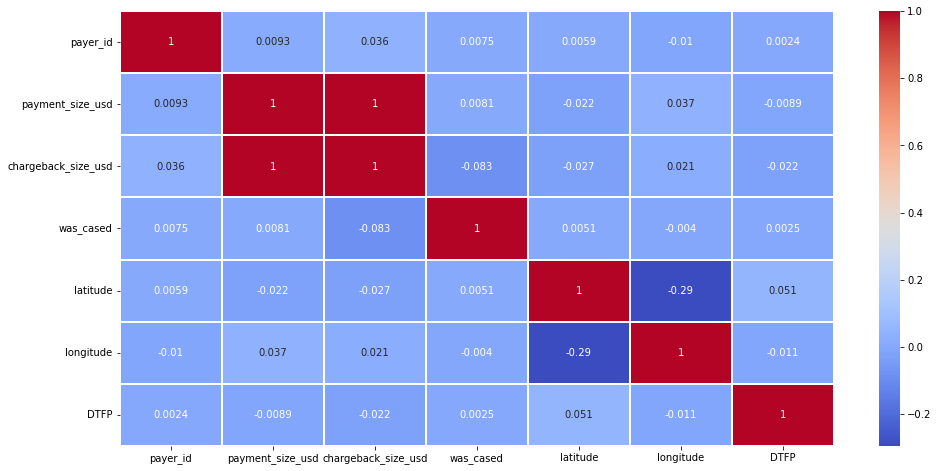

In [12]:
plt.figure(figsize=(16,8))
sns.heatmap(df_explore.corr(), annot=True, linewidths=2, cmap= 'coolwarm')

# percent of total gross payment volume (GPV) comes from sellers located in San Francisco

In [13]:
df_explore['payment_size_usd'].sum()

897931.06

In [14]:
df1=df_explore['payment_size_usd'].sum()

In [15]:
df_explore[df_explore['latitude']==37.7798928]['payment_size_usd'].sum()

42.230000000000004

In [16]:
df2=df_explore[df_explore['latitude']==37.7798928]['payment_size_usd'].sum()

In [17]:
print(df2/df1)

4.703033660512869e-05


# top three MCCs (business_category) by fraud chargeback rate (calculated using dollars)

In [18]:
df_explore[df_explore['chargeback_type']=='fraud'].groupby(['business_category'])['chargeback_size_usd'].sum().sort_values(ascending=[False])

business_category
food_and_drink                        6437.389167
retail                                2982.184650
beauty_and_personal_care              2216.506364
health_care_and_fitness               1282.583884
professional_services                 1208.316748
casual_use                             951.850000
leisure_and_entertainment              840.260000
transportation                         566.060000
charities_education_and_membership     498.070000
home_and_repair                        219.000000
UNKNOWN                                 30.520000
Name: chargeback_size_usd, dtype: float64

# Metric to gauge the accuracy of our rules/models

In [19]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.datasets import load_iris

Sklearn has a wonderful function called accuracy_score for classification models, which we can use to test how accurate our model is. Essentially this is comparing the predicted values against the actual values in our model.


# evaluate accuracy
print(accuracy_score(y_test, pred))

# Number of correct predictions

comparison = (y_test == pred)
np.count_nonzero(comparison) #although its called non_zero, with boolean values this tests for # of True

comparison

# the number of mispredictions

np.size(comparison)-np.count_nonzero(comparison)

# Same result as above - the number of mispredictions

np.count_nonzero(comparison == False)

Now, with classification models like this one, our accuracy will change with different values of neighbours. We are going to build a loop to test different how different values of K impact our model. First we will generate 10 random train/test splits for each value of k, and then we will calculate the average accuracy for each value.

num_splits = 10 #train test splits
k_vals = [1, 3, 5, 7, 10, 20, 30, 40, 50] #each k value to be tested
accuracies = [] #list to collect the accuracy scores
comparisons = [] #list to collect the number of non_zero (or TRUE) values

for k in k_vals: #for each value of k we are going to first create an accuracy list, and a comp list, then populate these lists
    acc_samples = []
    comp_samples = []
    for i in range(num_splits):
        # make sure we don't set the `random_state` parameter to an integer, we want random splits
        X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.3)
        knn = KNeighborsClassifier(n_neighbors=k)
        knn.fit(X_train, y_train)
        y_pred = knn.predict(X_test)
        acc_samples.append(accuracy_score(y_test, y_pred)) #calculate the accuracy score and add to list
        comp_samples.append(np.count_nonzero(y_test == y_pred)) #count non_zeros and add to list
    accuracies.append(np.mean(acc_samples)) #for each k's list, calculate the mean score and add to master list
    comparisons.append(np.mean(comp_samples)) #for each k's list, calculate the mean non_zero values & add to master list

    #create a dataframe
compare_df = pd.DataFrame({'Correct Predictions':comparisons,'Accuracy Score':accuracies}, index=[k_vals])
compare_df

Plot the dataframe values

#4.1 Manual Review by Biz Category

In [25]:
df_explore[df_explore['chargeback_type']=='fraud'].groupby(['business_category'])['was_cased'].count()

business_category
UNKNOWN                                 1
beauty_and_personal_care               43
casual_use                              9
charities_education_and_membership     10
food_and_drink                        304
health_care_and_fitness                14
home_and_repair                         2
leisure_and_entertainment              10
professional_services                  14
retail                                 56
transportation                         16
Name: was_cased, dtype: int64

In [33]:
df3=df_explore.groupby(['business_category','was_cased'])['business_category'].count().unstack()
df3

was_cased,0,1
business_category,,
UNKNOWN,21,6
beauty_and_personal_care,1242,262
casual_use,255,48
charities_education_and_membership,463,106
food_and_drink,10523,2353
health_care_and_fitness,519,114
home_and_repair,156,25
leisure_and_entertainment,415,91
professional_services,627,124


In [36]:
df3['total_cases']=df3[0]+df3[1]

In [40]:
df3['%_review']=df3[1]/df3['total_cases']
df3

was_cased,0,1,total_cases,%_review
business_category,,,,
UNKNOWN,21,6,27,0.222222
beauty_and_personal_care,1242,262,1504,0.174202
casual_use,255,48,303,0.158416
charities_education_and_membership,463,106,569,0.186292
food_and_drink,10523,2353,12876,0.182743
health_care_and_fitness,519,114,633,0.180095
home_and_repair,156,25,181,0.138122
leisure_and_entertainment,415,91,506,0.179842
professional_services,627,124,751,0.165113


In [41]:
df3['%_review'].sort_values

<bound method Series.sort_values of business_category
UNKNOWN                               0.222222
beauty_and_personal_care              0.174202
casual_use                            0.158416
charities_education_and_membership    0.186292
food_and_drink                        0.182743
health_care_and_fitness               0.180095
home_and_repair                       0.138122
leisure_and_entertainment             0.179842
professional_services                 0.165113
retail                                0.180018
transportation                        0.176101
Name: %_review, dtype: float64>

#4.2 Fraud Chargeback % by Category not by dollar amount

In [42]:
df4=df_explore.groupby(['business_category','chargeback_type'])['business_category'].count().unstack()
df4

chargeback_type,fraud,non-fraud
business_category,,
UNKNOWN,1,1
beauty_and_personal_care,43,39
casual_use,9,5
charities_education_and_membership,10,16
food_and_drink,304,329
health_care_and_fitness,14,13
home_and_repair,2,2
leisure_and_entertainment,10,9
professional_services,14,14


In [44]:
df4['total_cases']=df4['fraud']+df4['non-fraud']

In [46]:
df4['%fraud']=df4['fraud']/df4['total_cases']
df4

chargeback_type,fraud,non-fraud,total_cases,%fraud
business_category,,,,
UNKNOWN,1,1,2,0.500000
beauty_and_personal_care,43,39,82,0.524390
casual_use,9,5,14,0.642857
charities_education_and_membership,10,16,26,0.384615
food_and_drink,304,329,633,0.480253
health_care_and_fitness,14,13,27,0.518519
home_and_repair,2,2,4,0.500000
leisure_and_entertainment,10,9,19,0.526316
professional_services,14,14,28,0.500000


In [48]:
df4['%fraud'].sort_values(ascending=[False])

business_category
casual_use                            0.642857
transportation                        0.592593
leisure_and_entertainment             0.526316
beauty_and_personal_care              0.524390
health_care_and_fitness               0.518519
UNKNOWN                               0.500000
home_and_repair                       0.500000
professional_services                 0.500000
food_and_drink                        0.480253
retail                                0.448000
charities_education_and_membership    0.384615
Name: %fraud, dtype: float64